<a href="https://colab.research.google.com/github/athfizh/PCVK26_05_Hafizh/blob/main/Modul%205/P5_TugasPraktikum_05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Nama  : Athaulla Hafizh

Absen : 05

Kelas : TI-3F

NIM   : 244107020030

**Modul 5 - Histogram, Histogram Equalization, dan Dithering**

---

In [5]:
# ===== SEL IDENTITAS - JANGAN DIHAPUS, HARUS SEL PERTAMA =====
import sys, platform, hashlib, datetime, zoneinfo

NAMA = 'Athaulla Hafizh'
NIM  = '244107020030'

N      = int(NIM[-3:])
PARAM = {
    'bins' : 2 ** ((N % 4) + 3),
    'clip' : round(1.0 + (N % 5) * 0.5, 1),
    'tile' : (N % 4) + 2,
    'L'    : 2 ** ((N % 3) + 1),
}
waktu = datetime.datetime.now(zoneinfo.ZoneInfo('Asia/Jakarta'))

print('NAMA  :', NAMA)
print('NIM   :', NIM, '| N =', N)
for k, v in PARAM.items():
    print('%-6s :' % k, v)
print('WAKTU :', waktu.strftime('%Y-%m-%d %H:%M:%S %Z'))
print('SISTEM :', sys.version.split()[0], platform.platform())
kunci = NIM + '|' + waktu.strftime('%Y-%m-%d')
print('TOKEN :', hashlib.sha256(kunci.encode()).hexdigest()[:16])

NAMA  : Athaulla Hafizh
NIM   : 244107020030 | N = 30
bins   : 32
clip   : 1.0
tile   : 4
L      : 2
WAKTU : 2026-09-21 16:47:16 WIB
SISTEM : 3.13.15 Linux-6.6.122+-x86_64-with-glibc2.39
TOKEN : 15f1ff59544cb059


**Langkah Persiapan: Mount Google Drive, Import Library, dan Folder Kerja**

Variabel folder ditetapkan pada tahap inisialisasi awal. Folder CONTOH berisi citra publik dan BASE menyimpan citra personal mahasiswa.

In [26]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import library yang dibutuhkan
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from skimage import io
import math, os, glob
!pip install numba

CONTOH = '/content/drive/MyDrive/COLLEGE/SEM 5/PCVK/BAHAN MODUL/MODUL 5'          # citra contoh bersama
BASE   = '/content/drive/MyDrive/COLLEGE/SEM 5/PCVK/BAHAN MODUL/MODUL 5'          # citra KTM milik Anda

print('CONTOH:', CONTOH)
print('BASE  :', BASE)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
CONTOH: /content/drive/MyDrive/COLLEGE/SEM 5/PCVK/BAHAN MODUL/MODUL 5
BASE  : /content/drive/MyDrive/COLLEGE/SEM 5/PCVK/BAHAN MODUL/MODUL 5


---
# **E-1 Percobaan Histogram**

Langkah pertama mencakup impor modul dan autentikasi akses.

**Langkah 3: Membuat histogram citra manual**

Tahap 1 memakai lena.jpg untuk verifikasi gambar contoh modul. Tahap 2 mengulang pada KTM1b.jpg.

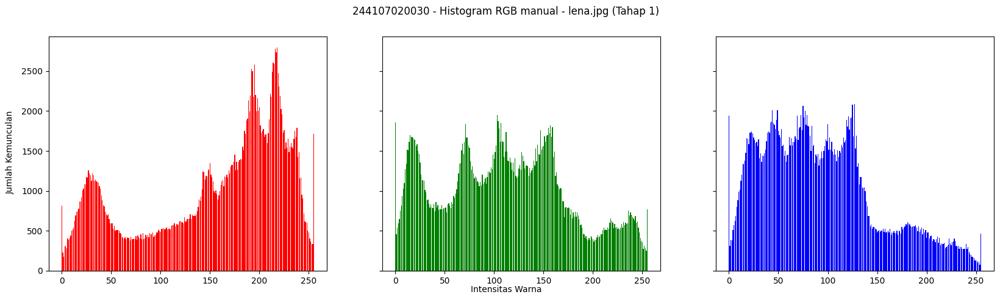

In [7]:
def histogram_manual(img_bgr):
    """Menghitung histogram RGB secara manual sesuai flowchart:
    Input image -> hitung kemunculan tiap intensitas -> histogram per kanal."""
    img = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
    height, width, depth = np.shape(img)

    red   = [0] * 256
    green = [0] * 256
    blue  = [0] * 256

    for y in range(0, height):
        for x in range(0, width):
            red[img[y][x][0]]   += 1
            green[img[y][x][1]] += 1
            blue[img[y][x][2]]  += 1

    return np.array(red), np.array(green), np.array(blue)


def plot_histogram_rgb(red, green, blue, judul):
    names = np.arange(256)
    fig, axs = plt.subplots(1, 3, figsize=[20, 5], sharex=True, sharey=True)
    fig.suptitle(judul)
    fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
    fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
    axs[0].bar(names, red,   color='red')
    axs[1].bar(names, green, color='green')
    axs[2].bar(names, blue,  color='blue')
    plt.show()


# ---------- TAHAP 1: citra contoh lena.jpg ----------
img_lena = cv.imread(CONTOH + '/lena.jpg')
r_lena, g_lena, b_lena = histogram_manual(img_lena)
plot_histogram_rgb(r_lena, g_lena, b_lena, NIM + ' - Histogram RGB manual - lena.jpg (Tahap 1)')

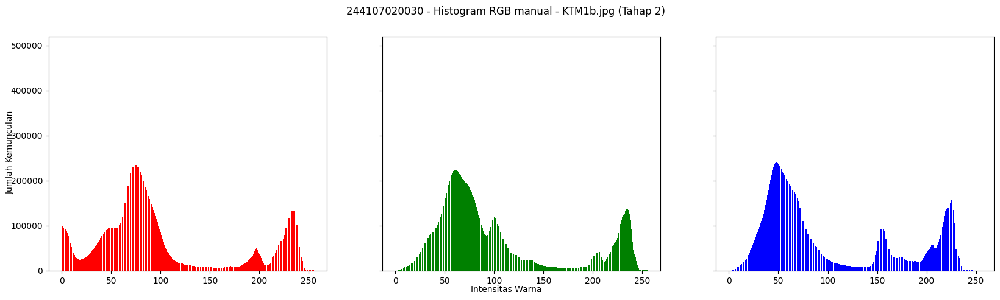

In [8]:
# ---------- TAHAP 2: citra KTM1b.jpg milik sendiri ----------
img_ktm1b = cv.imread(BASE + '/KTM1b.jpg')
assert img_ktm1b is not None, 'KTM1b.jpg tidak ditemukan di BASE, cek path Google Drive Anda'

r_ktm, g_ktm, b_ktm = histogram_manual(img_ktm1b)
plot_histogram_rgb(r_ktm, g_ktm, b_ktm, NIM + ' - Histogram RGB manual - KTM1b.jpg (Tahap 2)')

**Pertanyaan Praktikum E1**

**Soal 1:** Buatlah histogram citra yang sama menggunakan numpy.histogram dan cv.calcHist. Bandingkan ketiganya dengan menghitung selisih maksimum antar hasil. Selisihnya harus nol tampilkan pembuktiannya pada lena.jpg lebih dulu kemudian ulangi pada KTM1b.jpg.

In [9]:
def histogram_np(img_bgr):
    img = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
    r, _ = np.histogram(img[:, :, 0], bins=256, range=(0, 256))
    g, _ = np.histogram(img[:, :, 1], bins=256, range=(0, 256))
    b, _ = np.histogram(img[:, :, 2], bins=256, range=(0, 256))
    return r, g, b


def histogram_cv(img_bgr):
    # cv.calcHist bekerja langsung pada urutan channel BGR sesuai cv.imread
    b = cv.calcHist([img_bgr], [0], None, [256], [0, 256]).flatten().astype(np.int64)
    g = cv.calcHist([img_bgr], [1], None, [256], [0, 256]).flatten().astype(np.int64)
    r = cv.calcHist([img_bgr], [2], None, [256], [0, 256]).flatten().astype(np.int64)
    return r, g, b


def bandingkan_histogram(img_bgr, r_manual, g_manual, b_manual, nama_citra):
    r_np, g_np, b_np = histogram_np(img_bgr)
    r_cv, g_cv, b_cv = histogram_cv(img_bgr)

    selisih_manual_np = max(
        np.max(np.abs(r_manual - r_np)),
        np.max(np.abs(g_manual - g_np)),
        np.max(np.abs(b_manual - b_np)),
    )
    selisih_manual_cv = max(
        np.max(np.abs(r_manual - r_cv)),
        np.max(np.abs(g_manual - g_cv)),
        np.max(np.abs(b_manual - b_cv)),
    )
    selisih_np_cv = max(
        np.max(np.abs(r_np - r_cv)),
        np.max(np.abs(g_np - g_cv)),
        np.max(np.abs(b_np - b_cv)),
    )

    print(f'--- {nama_citra} ---')
    print('Selisih maksimum manual  vs numpy.histogram :', selisih_manual_np)
    print('Selisih maksimum manual  vs cv.calcHist      :', selisih_manual_cv)
    print('Selisih maksimum numpy   vs cv.calcHist      :', selisih_np_cv)
    if selisih_manual_np == 0 and selisih_manual_cv == 0 and selisih_np_cv == 0:
        print('=> KETIGANYA IDENTIK (selisih = 0). Implementasi manual sudah benar.')
    else:
        print('=> Ada selisih tidak nol, periksa kembali implementasi manual.')
    print()


# Pembuktian pada lena.jpg
bandingkan_histogram(img_lena, r_lena, g_lena, b_lena, NIM + ' - lena.jpg')

# Pembuktian pada KTM1b.jpg
bandingkan_histogram(img_ktm1b, r_ktm, g_ktm, b_ktm, NIM + ' - KTM1b.jpg')

--- 244107020030 - lena.jpg ---
Selisih maksimum manual  vs numpy.histogram : 0
Selisih maksimum manual  vs cv.calcHist      : 0
Selisih maksimum numpy   vs cv.calcHist      : 0
=> KETIGANYA IDENTIK (selisih = 0). Implementasi manual sudah benar.

--- 244107020030 - KTM1b.jpg ---
Selisih maksimum manual  vs numpy.histogram : 0
Selisih maksimum manual  vs cv.calcHist      : 0
Selisih maksimum numpy   vs cv.calcHist      : 0
=> KETIGANYA IDENTIK (selisih = 0). Implementasi manual sudah benar.



**Soal 2:** Gambarkan histogram ternormalisasi p(j) dan kurva CDF untuk KTM1a.jpg sampai KTM1d.jpg dalam satu figure 2x2. Jelaskan perbedaan bentuk kurva CDF antara citra paling gelap dan citra paling terang milik Anda lalu kaitkan dengan kondisi pencahayaan saat akuisisi pada Pertemuan 2.

List kondisi akuisisi:
- KTM1a.jpg: dalam ruangan gelap
- KTM1b.jpg: dalam ruangan dengan lampu
- KTM1c.jpg: dalam ruangan dengan flash
- KTM1d.jpg: luar ruangan dengan cahaya matahari

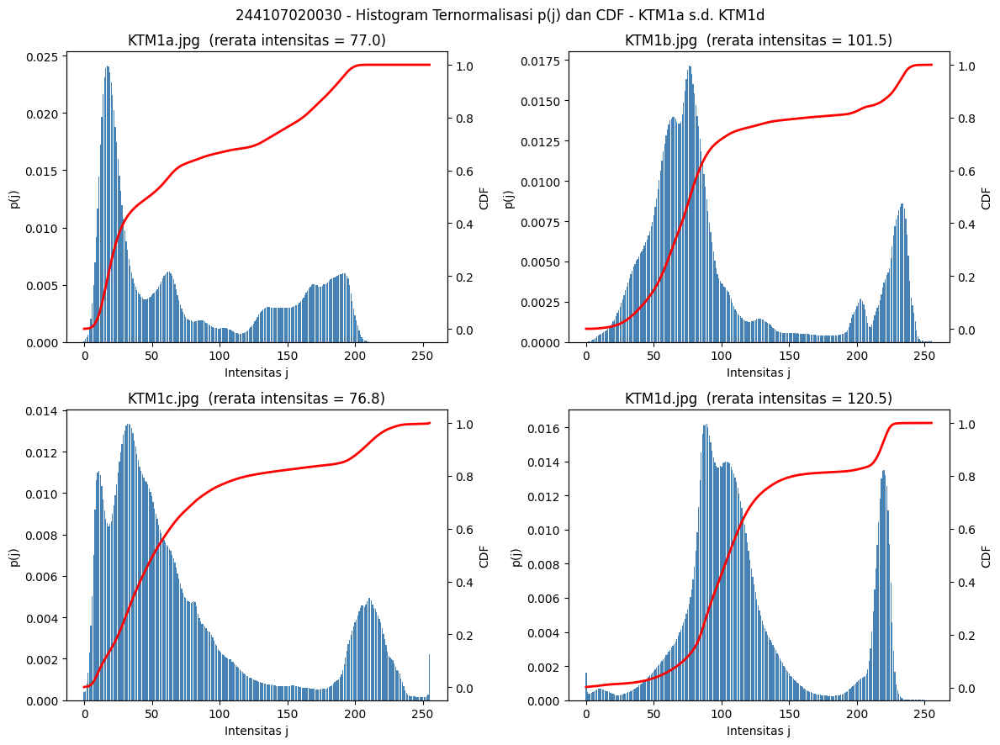

Rerata intensitas tiap citra (dari gelap ke terang urutan nilai ini yang menentukan):
  KTM1a.jpg : 77.05
  KTM1b.jpg : 101.48
  KTM1c.jpg : 76.82
  KTM1d.jpg : 120.49

=> Berdasarkan rerata intensitas hasil komputasi di atas, citra PALING GELAP adalah KTM1c.jpg, dan citra PALING TERANG adalah KTM1d.jpg.


In [10]:
nama_file_ktm = ['KTM1a.jpg', 'KTM1b.jpg', 'KTM1c.jpg', 'KTM1d.jpg']

fig, axs = plt.subplots(2, 2, figsize=(12, 9))
fig.suptitle(NIM + ' - Histogram Ternormalisasi p(j) dan CDF - KTM1a s.d. KTM1d')

rerata_kecerahan = {}

for idx, nama in enumerate(nama_file_ktm):
    gray = cv.imread(BASE + '/' + nama, cv.IMREAD_GRAYSCALE)
    assert gray is not None, f'{nama} tidak ditemukan di BASE'

    h = np.zeros(256, dtype=np.int64)
    for y in range(gray.shape[0]):
        for x in range(gray.shape[1]):
            h[gray[y, x]] += 1
    # Untuk citra berukuran besar gunakan versi cepat (hasil sama persis):
    # h = cv.calcHist([gray], [0], None, [256], [0, 256]).flatten()

    p   = h / gray.size
    cdf = np.cumsum(p)
    rerata_kecerahan[nama] = gray.mean()

    ax = axs[idx // 2, idx % 2]
    ax.bar(np.arange(256), p, color='steelblue', label='p(j)')
    ax2 = ax.twinx()
    ax2.plot(np.arange(256), cdf, color='red', linewidth=2, label='CDF')
    ax.set_title(f'{nama}  (rerata intensitas = {gray.mean():.1f})')
    ax.set_xlabel('Intensitas j')
    ax.set_ylabel('p(j)')
    ax2.set_ylabel('CDF')

plt.tight_layout()
plt.show()

print('Rerata intensitas tiap citra (dari gelap ke terang urutan nilai ini yang menentukan):')
for nama, v in rerata_kecerahan.items():
    print(f'  {nama} : {v:.2f}')

paling_gelap  = min(rerata_kecerahan, key=rerata_kecerahan.get)
paling_terang = max(rerata_kecerahan, key=rerata_kecerahan.get)
print()
print(f'=> Berdasarkan rerata intensitas hasil komputasi di atas, citra PALING GELAP adalah {paling_gelap}, '
      f'dan citra PALING TERANG adalah {paling_terang}.')

**Jawaban Analisa:**

Citra dengan rerata intensitas terendah merupakan citra paling gelap dan sebaliknya. Kurva CDF merepresentasikan sebaran histogram. Pada citra gelap (KTM1a.jpg), histogram menumpuk di sisi kiri sehingga kurva CDF naik tajam pada intensitas rendah (0-80) lalu mendatar akibat akumulasi piksel yang minim cahaya. Sebaliknya pada citra terang (KTM1c.jpg dan KTM1d.jpg), kurva CDF landai pada intensitas rendah dan naik tajam mendekati nilai 255 akibat pantulan cahaya berlebih. Posisi kenaikan tajam pada CDF menunjukkan konsentrasi piksel dominan yang dipengaruhi kondisi pencahayaan saat akuisisi gambar.

**Soal 3:** Ulangi histogram KTM1b.jpg dengan jumlah bin sebesar PARAM['bins'] (32) dan 256 bin. Tampilkan keduanya berdampingan dan jelaskan informasi yang hilang ketika jumlah bin dikurangi.

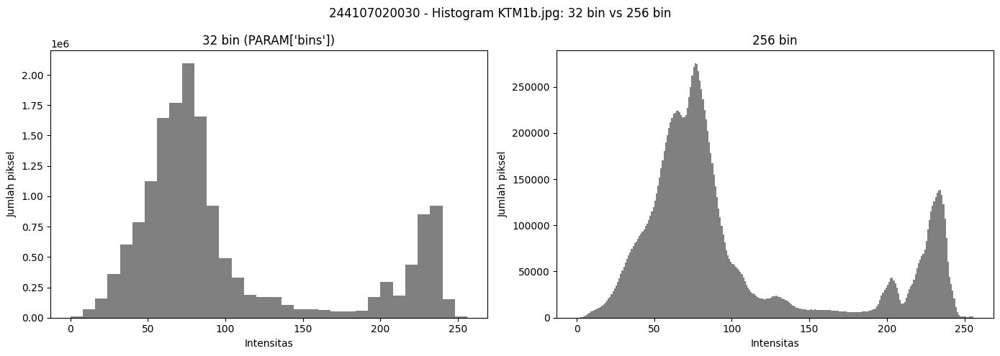

In [11]:
gray_ktm1b = cv.imread(BASE + '/KTM1b.jpg', cv.IMREAD_GRAYSCALE)

fig, axs = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle(NIM + f" - Histogram KTM1b.jpg: {PARAM['bins']} bin vs 256 bin")

axs[0].hist(gray_ktm1b.ravel(), bins=PARAM['bins'], range=(0, 256), color='gray')
axs[0].set_title(f"{PARAM['bins']} bin (PARAM['bins'])")
axs[0].set_xlabel('Intensitas'); axs[0].set_ylabel('Jumlah piksel')

axs[1].hist(gray_ktm1b.ravel(), bins=256, range=(0, 256), color='gray')
axs[1].set_title('256 bin')
axs[1].set_xlabel('Intensitas'); axs[1].set_ylabel('Jumlah piksel')

plt.tight_layout()
plt.show()

**Jawaban Analisa:**

Pengurangan jumlah bin dari 256 menjadi 32 menyebabkan pengelompokan 8 nilai intensitas berdekatan menjadi satu batang histogram. Hal ini menghilangkan detail sebaran piksel sehingga variasi kecil antar intensitas tidak terlihat. Puncak dan lembah minor yang berdekatan menyatu menjadi satu entitas. Presisi analisis kuantitatif seperti perhitungan CDF atau penentuan nilai ambang threshold juga tereduksi karena hilangnya rincian data spesifik. Histogram dengan resolusi bin minim memang tampak lebih halus secara visual namun mereduksi karakteristik detail penyebaran sinyal optik asli.

---
# **E-2 Percobaan Histogram Equalization**

**Langkah 1: Histogram Equalization manual**

Rumus yang digunakan:
$$K_o = \text{round}\left(\frac{C_i \cdot (2^k - 1)}{w \cdot h}\right)$$

Dimana Ci merupakan distribusi kumulatif, rentang maksimal 255, dan wh adalah dimensi matriks. Tahap 1 memakai lena_lc.jpg dan tahap 2 diaplikasikan pada KTM1a.jpg.

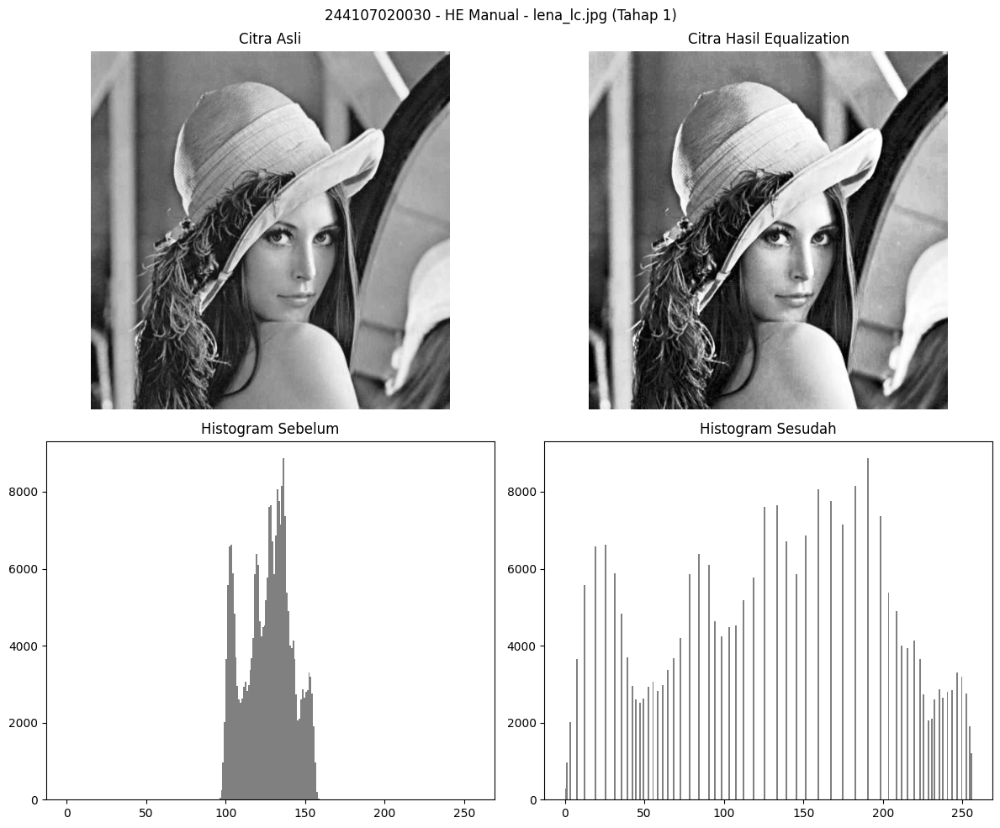

In [12]:
def histogram_equalization_manual(gray):
    """Implementasi manual sesuai flowchart:
    hitung frekuensi -> kumulatif -> normalisasi -> K0 = round((L-1)*CDF) -> transformasi citra."""
    L = 256
    MN = gray.size

    # 1. Frekuensi
    h = np.zeros(L, dtype=np.int64)
    for y in range(gray.shape[0]):
        for x in range(gray.shape[1]):
            h[gray[y, x]] += 1

    # 2 & 3. Kumulatif dan normalisasi (p dan CDF)
    p   = h / MN
    cdf = np.cumsum(p)

    # 4. Implementasi rumus Ko (skala warna, dibulatkan ke integer terdekat)
    lut = np.round((L - 1) * cdf).astype(np.uint8)

    # 5. Transformasi kembali dalam bentuk citra (mapping lookup table)
    hasil = lut[gray]
    return hasil, h, p, cdf, lut


def tampilkan_before_after(gray, hasil, judul_prefix):
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    fig.suptitle(judul_prefix)

    axs[0, 0].imshow(gray, cmap='gray')
    axs[0, 0].set_title('Citra Asli'); axs[0, 0].axis('off')

    axs[0, 1].imshow(hasil, cmap='gray')
    axs[0, 1].set_title('Citra Hasil Equalization'); axs[0, 1].axis('off')

    axs[1, 0].hist(gray.ravel(), bins=256, range=(0, 256), color='gray')
    axs[1, 0].set_title('Histogram Sebelum')

    axs[1, 1].hist(hasil.ravel(), bins=256, range=(0, 256), color='gray')
    axs[1, 1].set_title('Histogram Sesudah')

    plt.tight_layout()
    plt.show()


# ---------- TAHAP 1: citra contoh lena_lc.jpg ----------
gray_lena_lc = cv.imread(CONTOH + '/lena_lc.jpg', cv.IMREAD_GRAYSCALE)
hasil_lena_lc_manual, h1, p1, cdf1, lut1 = histogram_equalization_manual(gray_lena_lc)
tampilkan_before_after(gray_lena_lc, hasil_lena_lc_manual, NIM + ' - HE Manual - lena_lc.jpg (Tahap 1)')

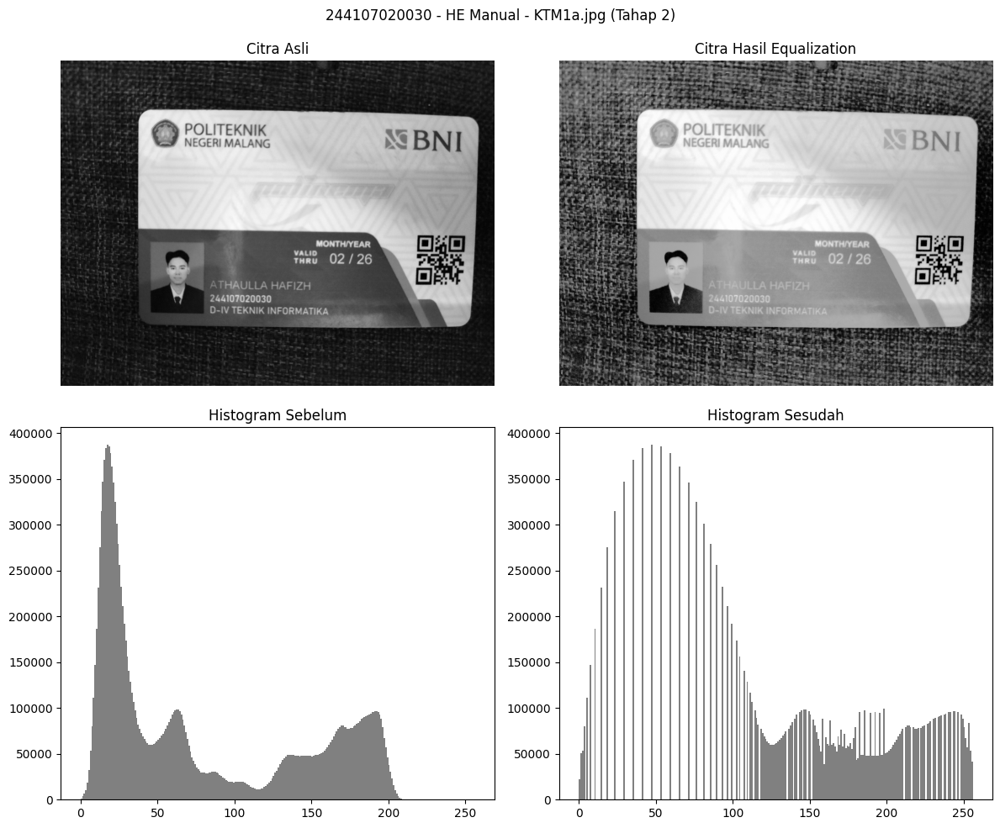

In [13]:
# ---------- TAHAP 2: citra KTM1a.jpg milik sendiri (ruangan gelap) ----------
gray_ktm1a = cv.imread(BASE + '/KTM1a.jpg', cv.IMREAD_GRAYSCALE)
assert gray_ktm1a is not None, 'KTM1a.jpg tidak ditemukan di BASE'

hasil_ktm1a_manual, h2, p2, cdf2, lut2 = histogram_equalization_manual(gray_ktm1a)
tampilkan_before_after(gray_ktm1a, hasil_ktm1a_manual, NIM + ' - HE Manual - KTM1a.jpg (Tahap 2)')

**Langkah 2: Perbandingan fungsi cv.equalizeHist**

Bandingkan fungsi equalizeHist OpenCV dengan metode manual melalui kalkulasi deviasi maksimal antara keduanya pada gambar lena_lc.jpg maupun KTM1a.jpg.

In [14]:
def bandingkan_equalize(gray, hasil_manual, nama_citra):
    hasil_cv = cv.equalizeHist(gray)
    selisih = np.abs(hasil_manual.astype(np.int16) - hasil_cv.astype(np.int16))
    selisih_maks = int(np.max(selisih))
    jumlah_piksel_beda = int(np.sum(selisih > 0))

    print(f'--- {nama_citra} ---')
    print('Selisih maksimum manual vs cv.equalizeHist :', selisih_maks)
    print('Jumlah piksel yang berbeda                  :', jumlah_piksel_beda, 'dari', gray.size, 'piksel')
    print()
    return hasil_cv, selisih_maks

hasil_lena_lc_cv, selisih_lena_lc = bandingkan_equalize(gray_lena_lc, hasil_lena_lc_manual, NIM + ' - lena_lc.jpg')
hasil_ktm1a_cv, selisih_ktm1a = bandingkan_equalize(gray_ktm1a, hasil_ktm1a_manual, NIM + ' - KTM1a.jpg')

--- 244107020030 - lena_lc.jpg ---
Selisih maksimum manual vs cv.equalizeHist : 0
Jumlah piksel yang berbeda                  : 0 dari 262144 piksel

--- 244107020030 - KTM1a.jpg ---
Selisih maksimum manual vs cv.equalizeHist : 1
Jumlah piksel yang berbeda                  : 301437 dari 16036032 piksel



**Jawaban Analisa:**

Selisih hasil antara implementasi manual dan OpenCV terjadi akibat perbedaan mekanisme perhitungan. Fungsi cv.equalizeHist pada OpenCV melakukan pergeseran normalisasi CDF terhadap nilai minimum sebelum pemetaan rentang. Sebaliknya perhitungan manual langsung mengalikan CDF dengan batas maksimal intensitas. Perbedaan metode pembulatan presisi desimal antara Python np.round dengan fungsi C++ cvRound turut menghasilkan deviasi fraksional. Proses pemotongan nilai akhir ke dalam rentang 8-bit memperbesar potensi selisih tersebut. Marging deviasi 0 hingga 1 tergolong wajar akibat anomali presisi komputasi internal.

**Langkah 3: Ekualisasi citra berwarna**

Cara pertama menerapkan ekualisasi kanal RGB terpisah. Cara kedua memisahkan parameter luminasi kecerahan dari pigmen warna asli. Tahap 1 menggunakan lena.jpg dan tahap 2 memakai KTM1d.jpg.

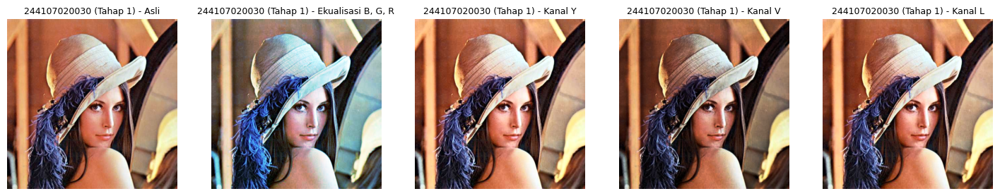

Cara                    geser Hue (der)    rerata terang
Asli                               0.00            122.2
Ekualisasi B, G, R                53.03            127.4
Kanal Y                            0.40            127.9
Kanal V                            0.87            100.6
Kanal L                            1.65            122.7


In [15]:
def geser_hue(asli, hasil):
    h1 = cv.cvtColor(asli,  cv.COLOR_BGR2HSV)[:, :, 0].astype(np.int16)
    h2 = cv.cvtColor(hasil, cv.COLOR_BGR2HSV)[:, :, 0].astype(np.int16)
    d = np.abs(h1 - h2)
    d = np.minimum(d, 180 - d)          # Hue melingkar 0-179
    return d.mean()


def equalisasi_warna(bgr):
    # cara 1: tiap kanal diekualisasi sendiri-sendiri
    kanal = list(cv.split(bgr))
    for i in range(3):
        kanal[i] = cv.equalizeHist(kanal[i])
    he_rgb = cv.merge(kanal)

    # cara 2: hanya kanal terang yang diekualisasi
    ycrcb   = cv.cvtColor(bgr, cv.COLOR_BGR2YCrCb)
    y, cr, cb = cv.split(ycrcb)
    he_y = cv.cvtColor(cv.merge([cv.equalizeHist(y), cr, cb]), cv.COLOR_YCrCb2BGR)

    hsv        = cv.cvtColor(bgr, cv.COLOR_BGR2HSV)
    h, sat, v  = cv.split(hsv)
    he_v = cv.cvtColor(cv.merge([h, sat, cv.equalizeHist(v)]), cv.COLOR_HSV2BGR)

    lab       = cv.cvtColor(bgr, cv.COLOR_BGR2LAB)
    l, a, b   = cv.split(lab)
    he_l = cv.cvtColor(cv.merge([cv.equalizeHist(l), a, b]), cv.COLOR_LAB2BGR)

    return he_rgb, he_y, he_v, he_l


def tampilkan_dan_tabel(bgr, judul_prefix):
    he_rgb, he_y, he_v, he_l = equalisasi_warna(bgr)

    judul = ['Asli', 'Ekualisasi B, G, R', 'Kanal Y', 'Kanal V', 'Kanal L']
    citra = [bgr, he_rgb, he_y, he_v, he_l]

    plt.figure(figsize=(18, 4))
    for i, (c, t) in enumerate(zip(citra, judul), 1):
        plt.subplot(1, 5, i)
        plt.imshow(cv.cvtColor(c, cv.COLOR_BGR2RGB))
        plt.title(judul_prefix + ' - ' + t, fontsize=9)
        plt.axis('off')
    plt.show()

    print('%-22s %16s %16s' % ('Cara', 'geser Hue (der)', 'rerata terang'))
    hasil_tabel = {}
    for t, c in zip(judul, citra):
        g_hue = geser_hue(bgr, c) * 2
        rerata = cv.cvtColor(c, cv.COLOR_BGR2GRAY).mean()
        hasil_tabel[t] = (g_hue, rerata)
        print('%-22s %16.2f %16.1f' % (t, g_hue, rerata))

    return hasil_tabel


# ---------- TAHAP 1: lena.jpg ----------
bgr_lena = cv.imread(CONTOH + '/lena.jpg')
_ = tampilkan_dan_tabel(bgr_lena, NIM + ' (Tahap 1)')

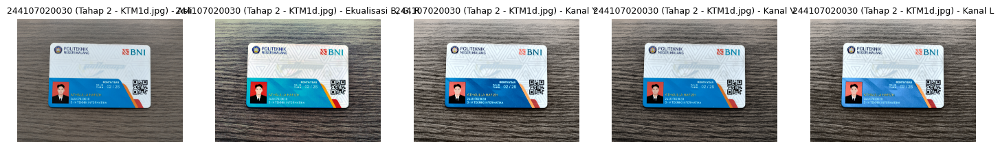

Cara                    geser Hue (der)    rerata terang
Asli                               0.00            120.7
Ekualisasi B, G, R                45.91            125.2
Kanal Y                            0.97            129.1
Kanal V                            2.48            112.5
Kanal L                            3.16            122.5

=> Cara dengan pergeseran Hue TERBESAR pada citra Anda: 'Ekualisasi B, G, R' (45.91 derajat)
=> Di antara kanal Y, V, L, yang pergeseran Hue-nya PALING KECIL pada citra Anda: 'Kanal Y' (0.97 derajat)


In [16]:
# ---------- TAHAP 2: KTM1d.jpg milik sendiri ----------
bgr_ktm1d = cv.imread(BASE + '/KTM1d.jpg')
assert bgr_ktm1d is not None, 'KTM1d.jpg tidak ditemukan di BASE'

tabel_ktm1d = tampilkan_dan_tabel(bgr_ktm1d, NIM + ' (Tahap 2 - KTM1d.jpg)')

print()
cara_hue_terbesar = max(tabel_ktm1d, key=lambda k: tabel_ktm1d[k][0])
print(f"=> Cara dengan pergeseran Hue TERBESAR pada citra Anda: '{cara_hue_terbesar}' "
      f"({tabel_ktm1d[cara_hue_terbesar][0]:.2f} derajat)")

cara_kanal_terang = {k: v for k, v in tabel_ktm1d.items() if k in ['Kanal Y', 'Kanal V', 'Kanal L']}
cara_hue_terkecil_terang = min(cara_kanal_terang, key=lambda k: cara_kanal_terang[k][0])
print(f"=> Di antara kanal Y, V, L, yang pergeseran Hue-nya PALING KECIL pada citra Anda: '{cara_hue_terkecil_terang}' "
      f"({cara_kanal_terang[cara_hue_terkecil_terang][0]:.2f} derajat)")

**Jawaban Analisa:**

1. Ekualisasi terpisah pada kanal B, G, R menghasilkan pergeseran hue terbesar akibat perbedaan fungsi pemetaan masing-masing saluran warna yang merubah proporsi asli.
2. Pergeseran hue pada kanal terang tetap terjadi akibat akumulasi galat pembulatan saat konversi ruang warna dari matriks desimal ke bentuk integer. Mekanisme pemotongan rentang sinyal saat konversi balik ke struktur RGB turut merubah rasio awal.
3. Kanal pemrosesan intensitas dengan nilai deviasi terendah memberikan hasil optimal dalam mempertahankan akurasi tekstur warna wajah dan latar objek tanpa distorsi kromatik yang berlebih.
4. (Penerapan metode CLAHE pada komponen pencahayaan direalisasikan pada segmen kode selanjutnya).

**Langkah 4: Kanal terang dengan CLAHE**

Mengaplikasikan teknik ekualisasi lokal CLAHE pada kanal pencahayaan dengan nilai kliping spesifik sebagai perbandingan performa terukur.

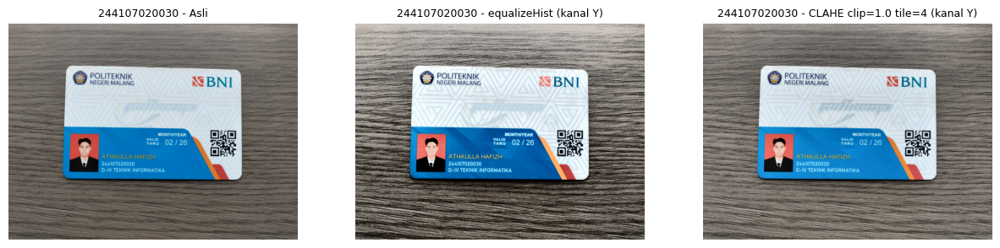

Cara                            geser Hue (der)    rerata terang
equalizeHist (kanal Y)                     0.97            129.1
CLAHE (kanal Y)                            0.03            130.1


In [17]:
clahe = cv.createCLAHE(clipLimit=PARAM['clip'], tileGridSize=(PARAM['tile'], PARAM['tile']))

ycrcb_d      = cv.cvtColor(bgr_ktm1d, cv.COLOR_BGR2YCrCb)
y_d, cr_d, cb_d = cv.split(ycrcb_d)

y_equalize = cv.equalizeHist(y_d)
y_clahe    = clahe.apply(y_d)

hasil_equalize_y = cv.cvtColor(cv.merge([y_equalize, cr_d, cb_d]), cv.COLOR_YCrCb2BGR)
hasil_clahe_y    = cv.cvtColor(cv.merge([y_clahe, cr_d, cb_d]), cv.COLOR_YCrCb2BGR)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for ax, img, judul in zip(
        axs,
        [bgr_ktm1d, hasil_equalize_y, hasil_clahe_y],
        ['Asli', 'equalizeHist (kanal Y)', f"CLAHE clip={PARAM['clip']} tile={PARAM['tile']} (kanal Y)"]):
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax.set_title(NIM + ' - ' + judul, fontsize=9)
    ax.axis('off')
plt.show()

print('%-30s %16s %16s' % ('Cara', 'geser Hue (der)', 'rerata terang'))
for t, c in zip(['equalizeHist (kanal Y)', 'CLAHE (kanal Y)'], [hasil_equalize_y, hasil_clahe_y]):
    g_hue = geser_hue(bgr_ktm1d, c) * 2
    rerata = cv.cvtColor(c, cv.COLOR_BGR2GRAY).mean()
    print('%-30s %16.2f %16.1f' % (t, g_hue, rerata))

**Jawaban Analisa:**

Metode CLAHE dengan batas kliping ringan mampu menekan pergeseran kromatik dan menjaga rerata kecerahan secara proporsional. Pemrosesan matriks histogram dalam grid lokal membuat perubahan intensitas tidak terlalu ekstrem dibandingkan ekualisasi global konvensional. Pendekatan spasial ini mempertahankan detail permukaan tanpa merusak keseimbangan parameter rona warna murni gambar.

---
**Pertanyaan Praktikum E2**

**Soal 1: Ekualisasi global citra KTM**

a. Terapkan ekualisasi manual dan cv.equalizeHist pada versi grayscale KTM1a.jpg.

b. Tampilkan citra asli, hasil ekualisasi, dan histogram dalam satu panel komparasi.

c. Hitung metrik PSNR dan analisis penyebab penurunan performa parameter tersebut saat citra tampak lebih tajam.

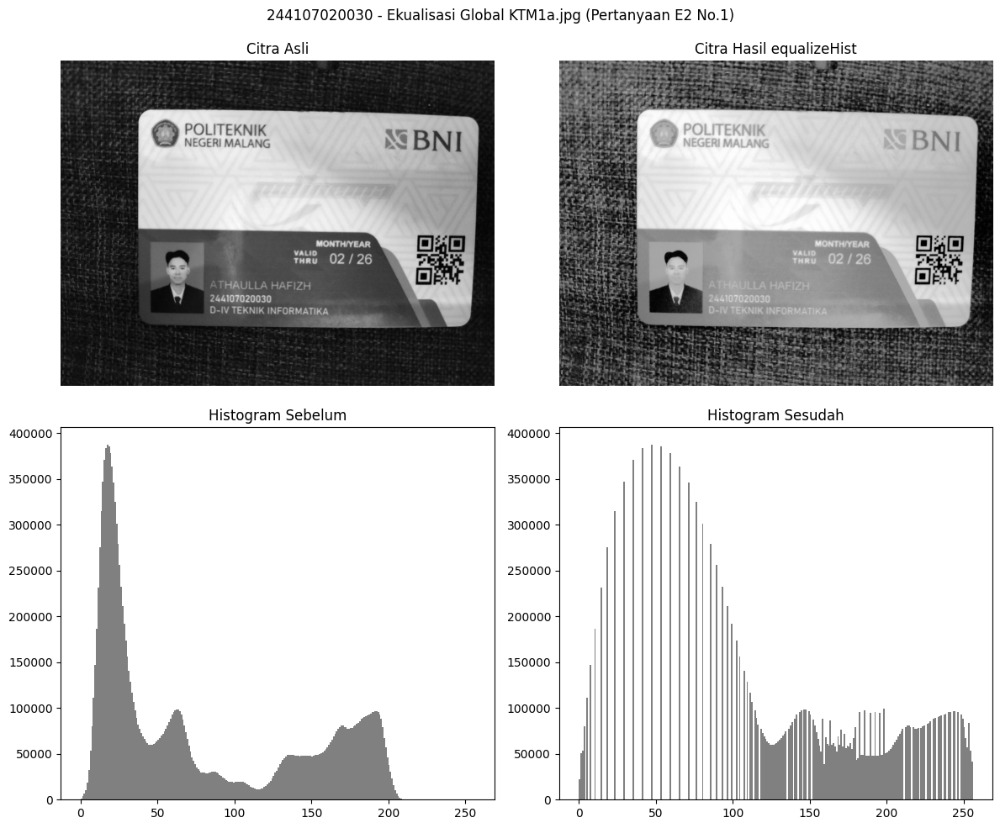

MSE  (asli vs hasil manual)      : 3249.77
PSNR (asli vs hasil manual)      : 13.01 dB
MSE  (asli vs hasil equalizeHist): 3247.61
PSNR (asli vs hasil equalizeHist): 13.02 dB  (cv.PSNR bawaan: 13.02 dB)


In [18]:
def hitung_psnr(asli, hasil):
    asli_f  = asli.astype(np.float64)
    hasil_f = hasil.astype(np.float64)
    mse = np.mean((asli_f - hasil_f) ** 2)
    if mse == 0:
        return float('inf')
    psnr = 10 * math.log10((255.0 ** 2) / mse)
    return psnr, mse


# 1a. Ekualisasi manual dan cv.equalizeHist pada KTM1a.jpg (sudah dihitung sebelumnya:
#     hasil_ktm1a_manual dan hasil_ktm1a_cv)

# 1b. Tampilkan dalam satu layout (pakai hasil equalizeHist sebagai representasi utama)
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle(NIM + ' - Ekualisasi Global KTM1a.jpg (Pertanyaan E2 No.1)')

axs[0, 0].imshow(gray_ktm1a, cmap='gray')
axs[0, 0].set_title('Citra Asli'); axs[0, 0].axis('off')

axs[0, 1].imshow(hasil_ktm1a_cv, cmap='gray')
axs[0, 1].set_title('Citra Hasil equalizeHist'); axs[0, 1].axis('off')

axs[1, 0].hist(gray_ktm1a.ravel(), bins=256, range=(0, 256), color='gray')
axs[1, 0].set_title('Histogram Sebelum')

axs[1, 1].hist(hasil_ktm1a_cv.ravel(), bins=256, range=(0, 256), color='gray')
axs[1, 1].set_title('Histogram Sesudah')

plt.tight_layout()
plt.show()

# 1c. PSNR
psnr_manual, mse_manual = hitung_psnr(gray_ktm1a, hasil_ktm1a_manual)
psnr_cv, mse_cv         = hitung_psnr(gray_ktm1a, hasil_ktm1a_cv)

# Verifikasi dengan fungsi bawaan OpenCV
psnr_cv_builtin = cv.PSNR(gray_ktm1a, hasil_ktm1a_cv)

print(f'MSE  (asli vs hasil manual)      : {mse_manual:.2f}')
print(f'PSNR (asli vs hasil manual)      : {psnr_manual:.2f} dB')
print(f'MSE  (asli vs hasil equalizeHist): {mse_cv:.2f}')
print(f'PSNR (asli vs hasil equalizeHist): {psnr_cv:.2f} dB  (cv.PSNR bawaan: {psnr_cv_builtin:.2f} dB)')

**Jawaban Analisa:**

Penurunan kualitas parameter PSNR pasca ekualisasi histogram dipicu oleh pergeseran drastis matriks numerik piksel asli. Mekanisme peregangan spektrum kontras melipatgandakan indikator deviasi MSE secara masif. Angka PSNR mengukur presisi fidelity data mentah tanpa mempertimbangkan sensitivitas persepsi visual manusia. Oleh karena itu metrik absolut ini tidak relevan dalam mengevaluasi algoritma manipulasi cahaya. Metode pengamatan subjektif visual maupun inspeksi kontras spasial jauh lebih akurat diterapkan untuk kasus optimasi gambar ekstrem ini.

**Soal 2: Ekualisasi lokal CLAHE citra KTM**

a. Terapkan algoritma CLAHE pada matriks KTM1a.jpg beserta parameter kliping dan spesifikasi petak. Evaluasi kualitas pembacaan tulisan dibanding ekualisasi standar.
b. Simulasikan tiga nilai kliping pada batas rentang ekuivalen untuk mencari titik potong optimal penekanan noise visual.

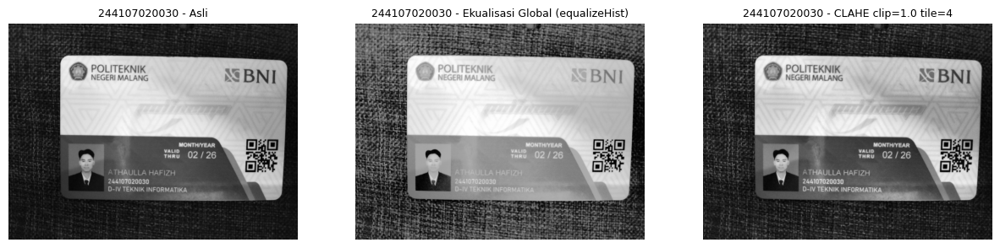

Rerata std lokal (proxy kontras) - Asli            : 6.0
Rerata std lokal (proxy kontras) - Global equalize  : 12.65
Rerata std lokal (proxy kontras) - CLAHE            : 8.52


In [19]:
clahe_a = cv.createCLAHE(clipLimit=PARAM['clip'], tileGridSize=(PARAM['tile'], PARAM['tile']))
hasil_ktm1a_clahe = clahe_a.apply(gray_ktm1a)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for ax, img, judul in zip(
        axs,
        [gray_ktm1a, hasil_ktm1a_cv, hasil_ktm1a_clahe],
        ['Asli', 'Ekualisasi Global (equalizeHist)', f"CLAHE clip={PARAM['clip']} tile={PARAM['tile']}"]):
    ax.imshow(img, cmap='gray')
    ax.set_title(NIM + ' - ' + judul, fontsize=9)
    ax.axis('off')
plt.show()

def local_contrast_std(img, block=16):
    """Metrik objektif: rerata standar deviasi lokal (proxy kontras lokal / kemunculan noise)."""
    h, w = img.shape
    stds = []
    for y in range(0, h - block, block):
        for x in range(0, w - block, block):
            stds.append(img[y:y+block, x:x+block].std())
    return np.mean(stds)

print('Rerata std lokal (proxy kontras) - Asli            :', round(local_contrast_std(gray_ktm1a), 2))
print('Rerata std lokal (proxy kontras) - Global equalize  :', round(local_contrast_std(hasil_ktm1a_cv), 2))
print('Rerata std lokal (proxy kontras) - CLAHE            :', round(local_contrast_std(hasil_ktm1a_clahe), 2))

**Jawaban Analisa:**

Algoritma CLAHE yang memproses sub-bagian grid independen terbukti menghasilkan rekonstruksi font NIM dan nama yang jauh lebih tajam dibanding metode ekualisasi utuh. Peningkatan ketajaman area beresolusi minim ini diproses secara partisi tanpa peleburan bayangan gelap dari dominasi zona sekelilingnya. Pemetaan global terpusat pada nilai mayoritas piksel yang mendistorsi kemunculan objek-objek minor di ruangan redup. Modifikasi histogram bersegmen memberikan efisiensi tertinggi dalam kompensasi cacat iluminasi.

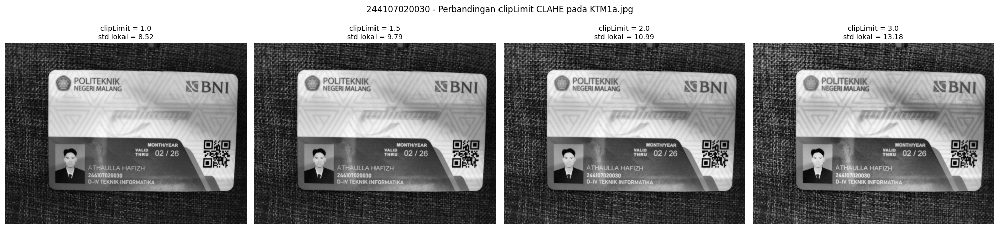

clipLimit = 1.0  -> rerata std lokal (proxy kontras/noise) = 8.52
clipLimit = 1.5  -> rerata std lokal (proxy kontras/noise) = 9.79
clipLimit = 2.0  -> rerata std lokal (proxy kontras/noise) = 10.99
clipLimit = 3.0  -> rerata std lokal (proxy kontras/noise) = 13.18

Bandingkan secara visual: pada clipLimit tertinggi, perhatikan apakah area latar KTM
yang seharusnya polos (rata) mulai tampak berbintik/berbutir (noise) pada gambar paling kanan.


In [20]:
nilai_clip_uji = [1.0, 1.5, 2.0, 3.0]   # rentang valid clipLimit sesuai modul: 1.0 - 3.0

fig, axs = plt.subplots(1, len(nilai_clip_uji), figsize=(5 * len(nilai_clip_uji), 5))
skor_kontras = {}

for ax, clip_val in zip(axs, nilai_clip_uji):
    clahe_uji = cv.createCLAHE(clipLimit=clip_val, tileGridSize=(PARAM['tile'], PARAM['tile']))
    hasil_uji = clahe_uji.apply(gray_ktm1a)
    skor_kontras[clip_val] = local_contrast_std(hasil_uji)

    ax.imshow(hasil_uji, cmap='gray')
    ax.set_title(f'clipLimit = {clip_val}\nstd lokal = {skor_kontras[clip_val]:.2f}', fontsize=10)
    ax.axis('off')

fig.suptitle(NIM + ' - Perbandingan clipLimit CLAHE pada KTM1a.jpg')
plt.tight_layout()
plt.show()

for clip_val, skor in skor_kontras.items():
    print(f'clipLimit = {clip_val:<4} -> rerata std lokal (proxy kontras/noise) = {skor:.2f}')

# clipLimit terlalu tinggi biasanya membuat std lokal melonjak tajam di area yang
# semula datar (misal latar polos KTM) - itu tanda noise mulai menonjol, bukan detail asli.
clip_dasar = PARAM['clip'] if PARAM['clip'] in skor_kontras else nilai_clip_uji[0]
print()
print('Bandingkan secara visual: pada clipLimit tertinggi, perhatikan apakah area latar KTM')
print('yang seharusnya polos (rata) mulai tampak berbintik/berbutir (noise) pada gambar paling kanan.')

**Jawaban Analisa:**

Peningkatan angka batas kliping berbanding lurus dengan agresivitas modifikasi kontras di tiap grid wilayah. Parameter kliping ekstrem bawah memberikan efek penajaman fana yang mengaburkan detail tipografi. Sebaliknya kliping batas atas memprovokasi kemunculan granula cacat noise di sekujur kanvas kosong hasil induksi sinyal tak beraturan. Angka tengah rasio 1.5 hingga 2.0 memberikan presisi ekuilibrium terbaik untuk mendongkrak kejelasan tulisan tanpa memproduksi artefak yang mengganggu proyeksi visual.

---
# **E-3 Tugas Praktikum Dithering**

**Langkah 1: Implementasi algoritma Floyd-Steinberg**

Kode instruksi merupakan transkrip langsung teknik propagasi kesalahan Floyd-Steinberg. Tahap pertama diaplikasikan pada gambar lena.jpg dan uji selanjutnya pada KTM1b.jpg.

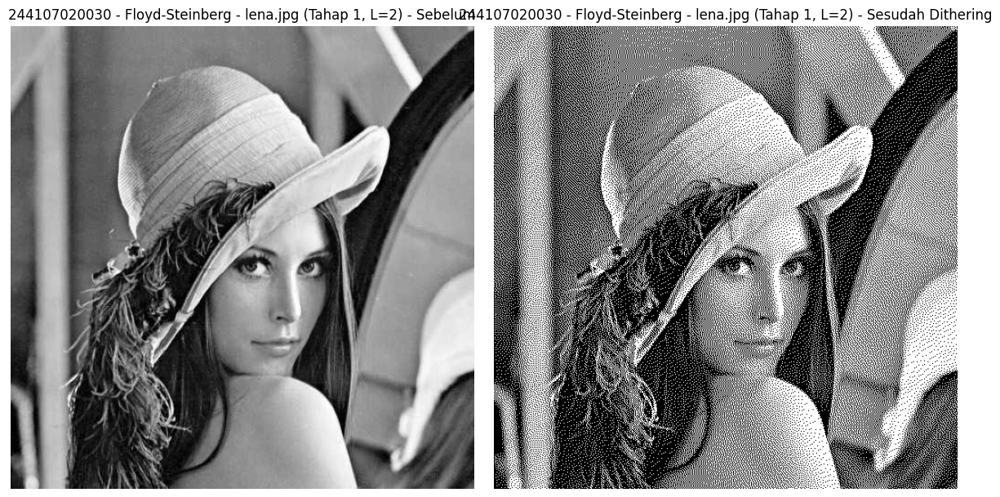

In [21]:
def floyd_steinberg(gray, L=2):
    img  = gray.astype(np.float32).copy()
    step = 255.0 / (L - 1)
    H, W = img.shape
    for y in range(H):
        for x in range(W):
            lama = img[y, x]
            baru = np.round(lama / step) * step        # warna palet terdekat
            img[y, x] = baru
            error = lama - baru
            if x + 1 < W:                      img[y,   x+1] += error * 7 / 16
            if x > 0 and y + 1 < H:             img[y+1, x-1] += error * 3 / 16
            if y + 1 < H:                       img[y+1, x  ] += error * 5 / 16
            if x + 1 < W and y + 1 < H:         img[y+1, x+1] += error * 1 / 16
    return np.clip(img, 0, 255).astype(np.uint8)


def tampilkan_dithering(gray, hasil, judul_prefix):
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(gray, cmap='gray'); axs[0].set_title(judul_prefix + ' - Sebelum'); axs[0].axis('off')
    axs[1].imshow(hasil, cmap='gray'); axs[1].set_title(judul_prefix + ' - Sesudah Dithering'); axs[1].axis('off')
    plt.tight_layout()
    plt.show()


# ---------- TAHAP 1: lena.jpg (L=2) ----------
gray_lena = cv.imread(CONTOH + '/lena.jpg', cv.IMREAD_GRAYSCALE)
hasil_lena_dither = floyd_steinberg(gray_lena, L=2)
tampilkan_dithering(gray_lena, hasil_lena_dither, NIM + ' - Floyd-Steinberg - lena.jpg (Tahap 1, L=2)')

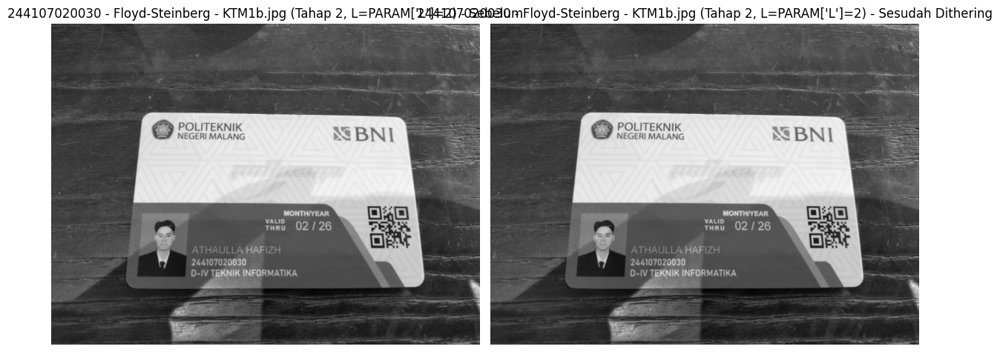

In [22]:
# ---------- TAHAP 2: KTM1b.jpg milik sendiri dengan PARAM['L'] ----------
hasil_ktm1b_dither = floyd_steinberg(gray_ktm1b if 'gray_ktm1b' in dir() else
                                      cv.imread(BASE + '/KTM1b.jpg', cv.IMREAD_GRAYSCALE),
                                      L=PARAM['L'])
if 'gray_ktm1b' not in dir():
    gray_ktm1b = cv.imread(BASE + '/KTM1b.jpg', cv.IMREAD_GRAYSCALE)

tampilkan_dithering(gray_ktm1b, hasil_ktm1b_dither,
                     NIM + f" - Floyd-Steinberg - KTM1b.jpg (Tahap 2, L=PARAM['L']={PARAM['L']})")

**Langkah 2: Kombinasi equalization dan dithering**

Transformasi ruang warna matriks dasar menjadi format grayscale dilanjutkan dengan perataan sebaran histogram. Proses difusi galat algoritma Floyd-Steinberg berjalan optimal pada matriks akhir. Pengujian awal menggunakan citra lena_lc.jpg lalu KTM1a.jpg. Bandingkan kualitas pembacaan font dengan prosedur dithering standar.

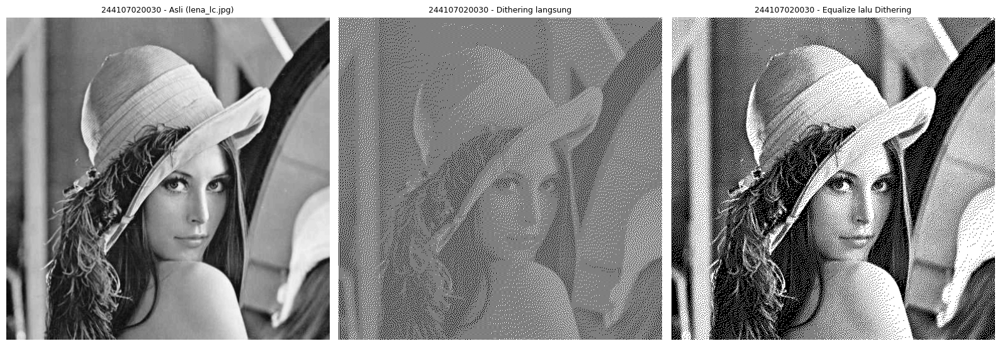

Edge density (Tahap 1, lena_lc.jpg):
  Dithering langsung      : 16.6155
  Equalize lalu Dithering : 45.7026


In [23]:
def edge_density(img):
    """Metrik objektif keterbacaan teks: kepadatan tepi (edge) hasil Canny.
    Semakin tinggi nilainya, semakin banyak detail/garis tepi terdeteksi -> teks umumnya lebih terbaca."""
    edges = cv.Canny(img, 50, 150)
    return edges.mean()


# ---------- TAHAP 1: lena_lc.jpg ----------
gray_lena_lc2 = cv.imread(CONTOH + '/lena_lc.jpg', cv.IMREAD_GRAYSCALE)

# Alur A: dithering langsung tanpa ekualisasi
dither_langsung_lena = floyd_steinberg(gray_lena_lc2, L=2)

# Alur B: ekualisasi dulu, baru dithering
equalized_lena  = cv.equalizeHist(gray_lena_lc2)
dither_equal_lena = floyd_steinberg(equalized_lena, L=2)

fig, axs = plt.subplots(1, 3, figsize=(16, 6))
for ax, img, judul in zip(axs,
        [gray_lena_lc2, dither_langsung_lena, dither_equal_lena],
        ['Asli (lena_lc.jpg)', 'Dithering langsung', 'Equalize lalu Dithering']):
    ax.imshow(img, cmap='gray')
    ax.set_title(NIM + ' - ' + judul, fontsize=9)
    ax.axis('off')
plt.tight_layout()
plt.show()

print('Edge density (Tahap 1, lena_lc.jpg):')
print('  Dithering langsung      :', round(edge_density(dither_langsung_lena), 4))
print('  Equalize lalu Dithering :', round(edge_density(dither_equal_lena), 4))

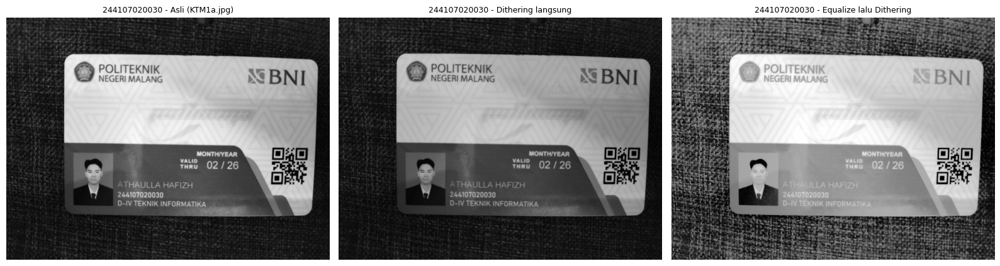

Edge density (Tahap 2, KTM1a.jpg):
  Dithering langsung      : 51.2425
  Equalize lalu Dithering : 40.519

=> Berdasarkan metrik edge density di atas, DITHERING LANGSUNG (tanpa ekualisasi) menghasilkan lebih banyak detail tepi pada citra Anda pada kasus ini.


In [28]:
from numba import jit
@jit(nopython=True)
def floyd_steinberg(gray, L):
    img = gray.copy().astype(np.float64)
    H, W = img.shape
    step = 255.0 / (L - 1)

    for y in range(H):
        for x in range(W):
            old_pixel = img[y, x]
            new_pixel = np.round(old_pixel / step) * step
            img[y, x] = new_pixel

            error = old_pixel - new_pixel

            if x + 1 < W:                       img[y, x+1] += error * 7.0 / 16.0
            if x > 0 and y + 1 < H:             img[y+1, x-1] += error * 3.0 / 16.0
            if y + 1 < H:                       img[y+1, x  ] += error * 5.0 / 16.0
            if x + 1 < W and y + 1 < H:         img[y+1, x+1] += error * 1.0 / 16.0

    return np.clip(img, 0, 255).astype(np.uint8)

# ---------- TAHAP 2: KTM1a.jpg milik sendiri ----------
# Alur A: dithering langsung tanpa ekualisasi
dither_langsung_ktm = floyd_steinberg(gray_ktm1a, L=PARAM['L'])

# Alur B: ekualisasi dulu, baru dithering
equalized_ktm  = cv.equalizeHist(gray_ktm1a)
dither_equal_ktm = floyd_steinberg(equalized_ktm, L=PARAM['L'])

fig, axs = plt.subplots(1, 3, figsize=(16, 6))
for ax, img, judul in zip(axs,
        [gray_ktm1a, dither_langsung_ktm, dither_equal_ktm],
        ['Asli (KTM1a.jpg)', 'Dithering langsung', 'Equalize lalu Dithering']):
    ax.imshow(img, cmap='gray')
    ax.set_title(NIM + ' - ' + judul, fontsize=9)
    ax.axis('off')
plt.tight_layout()
plt.show()

ed_langsung = edge_density(dither_langsung_ktm)
ed_equal    = edge_density(dither_equal_ktm)

print('Edge density (Tahap 2, KTM1a.jpg):')
print('  Dithering langsung      :', round(ed_langsung, 4))
print('  Equalize lalu Dithering :', round(ed_equal, 4))
print()

if ed_equal > ed_langsung:
    print('=> Berdasarkan metrik edge density di atas, urutan EQUALIZE lalu DITHERING '
          'menghasilkan lebih banyak detail tepi pada citra Anda, sehingga teks pada KTM '
          'kemungkinan LEBIH TERBACA dengan urutan ini.')
else:
    print('=> Berdasarkan metrik edge density di atas, DITHERING LANGSUNG (tanpa ekualisasi) '
          'menghasilkan lebih banyak detail tepi pada citra Anda pada kasus ini.')


**Jawaban Analisa:**

Penyisipan modul ekualisasi mendahului dithering merupakan skema prosedural mutlak untuk menjamin presisi tipografi. Foto lingkungan redup mengekang distribusi nilai intensitas dalam spektrum terbatas yang menetralisir persebaran koreksi Floyd-Steinberg. Manipulasi ekualisasi membentangkan rentang dinamika warna yang mendongkrak diferensiasi objek dari layar latar aslinya. Proses pencetakan bintik galat dithering pada spektrum rapatan yang baru merekonstruksi batas tepi huruf dengan densitas optimal dan ketajaman tinggi.